In [1]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [2]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['TCS.NS', 'INFY.NS', 'WIPRO.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


TCS.NS
[*********************100%***********************]  1 of 1 completed
INFY.NS
[*********************100%***********************]  1 of 1 completed
WIPRO.NS
[*********************100%***********************]  1 of 1 completed


In [3]:
df_raw.head()

,TCS.NS,INFY.NS,WIPRO.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,-0.00845,0.01122,0.00290
2017-05-31,-0.00176,-0.01922,-0.00121
2017-06-01,0.00275,0.00946,0.01055
2017-06-02,0.00442,-0.00201,0.01940


In [4]:
bad_tickers

[]

In [5]:
tickers

['TCS.NS', 'INFY.NS', 'WIPRO.NS']

In [6]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [7]:
result.shape
result.ndim

(10000, 6)

2

In [8]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    # Annualizing mean
    E = E*252
    

    
    # Calculating Downside SD
    DSD = df['portfolio_ret'][df['portfolio_ret']<0].std()
    #Annualizing DSD
    DSD = DSD*np.sqrt(252)
                       
   
    #Calculating Annualized Sortino
    Sortino = E/DSD
    
                   
    # Populating the 'result' array with the required values: Mean, SD, Sharpe followed by the weights                   
    result[i,0] = E
    result[i,1] = DSD
    result[i,2] = Sortino
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [9]:
# Converting 'result' into a DataFrame

columns = ['Mean','Downside SD', 'Sortino'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Downside SD,Sortino,TCS.NS,INFY.NS,WIPRO.NS
0,0.169906,0.173671,0.978322,0.259500,0.374640,0.365860
1,0.157737,0.169571,0.930210,0.249478,0.300755,0.449766
2,0.198231,0.179066,1.107025,0.430898,0.389754,0.179348
3,0.154127,0.164033,0.939610,0.393292,0.123350,0.483359
4,0.174268,0.166632,1.045828,0.429005,0.225374,0.345621
5,0.173665,0.179514,0.967421,0.213390,0.449587,0.337023
6,0.137912,0.165055,0.835552,0.319983,0.088412,0.591605
7,0.174307,0.165559,1.052837,0.573650,0.072418,0.353932
8,0.170649,0.166783,1.023180,0.392858,0.238531,0.368611
9,0.158440,0.164532,0.962979,0.383682,0.163480,0.452838


In [10]:
Max_Sortino = result.iloc[result['Sortino'].idxmax()]
Max_Sortino

Min_DSD = result.iloc[result['Downside SD'].idxmin()]
Min_DSD

Mean           0.226367
Downside SD    0.187040
Sortino        1.210260
TCS.NS         0.726413
INFY.NS        0.272086
WIPRO.NS       0.001501
Name: 5694, dtype: float64

Mean           0.149213
Downside SD    0.163752
Sortino        0.911216
TCS.NS         0.476394
INFY.NS        0.001200
WIPRO.NS       0.522406
Name: 7607, dtype: float64

In [11]:
result.iloc[5201]

Mean           0.188809
Downside SD    0.177378
Sortino        1.064444
TCS.NS         0.361107
INFY.NS        0.398259
WIPRO.NS       0.240634
Name: 5201, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Downside Volatility')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

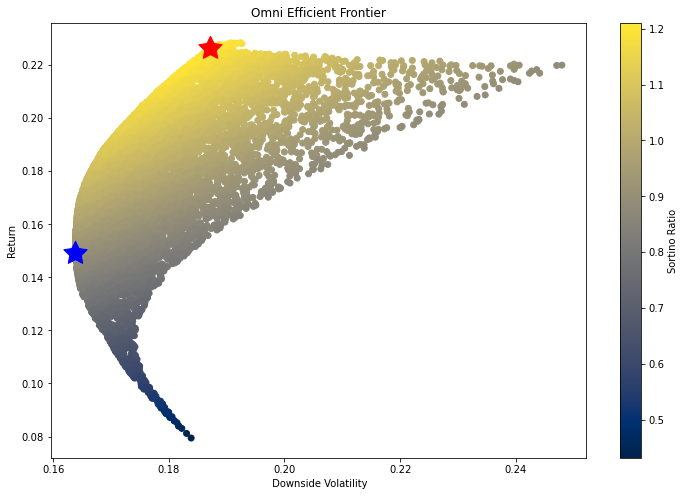

In [12]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Downside SD'],y=result['Mean'],c=result['Sortino'],cmap='cividis')
plt.colorbar(label='Sortino Ratio')
plt.xlabel(' Downside Volatility')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Sortino[1],Max_Sortino[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_DSD[1],Min_DSD[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [13]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [14]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['MARUTI.NS', 'HEROMOTOCO.NS', 'M&M.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


MARUTI.NS
[*********************100%***********************]  1 of 1 completed
HEROMOTOCO.NS
[*********************100%***********************]  1 of 1 completed
M&M.NS
[*********************100%***********************]  1 of 1 completed


In [18]:
df_raw.head()

,MARUTI.NS,HEROMOTOCO.NS,M&M.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,0.00183,0.02034,0.00077
2017-05-31,0.00888,0.00136,0.04103
2017-06-01,-0.00893,-0.00323,0.00586
2017-06-02,-0.00446,0.03118,-0.00474


In [19]:
bad_tickers

[]

In [20]:
tickers

['MARUTI.NS', 'HEROMOTOCO.NS', 'M&M.NS']

In [21]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [22]:
result.shape
result.ndim

(10000, 6)

2

In [23]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    # Annualizing mean
    E = E*252
    

    
    # Calculating Downside SD
    DSD = df['portfolio_ret'][df['portfolio_ret']<0].std()
    #Annualizing DSD
    DSD = DSD*np.sqrt(252)
                       
   
    #Calculating Annualized Sortino
    Sortino = E/DSD
    
                   
    # Populating the 'result' array with the required values: Mean, SD, Sharpe followed by the weights                   
    result[i,0] = E
    result[i,1] = DSD
    result[i,2] = Sortino
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [24]:
# Converting 'result' into a DataFrame

columns = ['Mean','Downside SD', 'Sortino'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Downside SD,Sortino,MARUTI.NS,HEROMOTOCO.NS,M&M.NS
0,-0.015825,0.210788,-0.075077,0.490509,0.231819,0.277671
1,-0.013380,0.216356,-0.061842,0.539313,0.418454,0.042233
2,-0.022119,0.203230,-0.108836,0.295200,0.265119,0.439681
3,-0.020271,0.201227,-0.100736,0.327899,0.437007,0.235095
4,-0.029289,0.206560,-0.141794,0.003443,0.813302,0.183255
5,-0.021235,0.202836,-0.104689,0.318592,0.290236,0.391172
6,-0.020935,0.204757,-0.102245,0.332749,0.252795,0.414456
7,-0.019348,0.221487,-0.087353,0.413507,0.012404,0.574089
8,-0.027369,0.196746,-0.139106,0.117546,0.401483,0.480971
9,-0.028320,0.194807,-0.145374,0.071363,0.529271,0.399366


In [25]:
Max_Sortino = result.iloc[result['Sortino'].idxmax()]
Max_Sortino

Min_DSD = result.iloc[result['Downside SD'].idxmin()]
Min_DSD

Mean            -0.001348
Downside SD      0.250549
Sortino         -0.005380
MARUTI.NS        0.957519
HEROMOTOCO.NS    0.024573
M&M.NS           0.017908
Name: 8284, dtype: float64

Mean            -0.029420
Downside SD      0.194591
Sortino         -0.151191
MARUTI.NS        0.040381
HEROMOTOCO.NS    0.511762
M&M.NS           0.447857
Name: 6785, dtype: float64

In [26]:
result.iloc[8284]

Mean            -0.001348
Downside SD      0.250549
Sortino         -0.005380
MARUTI.NS        0.957519
HEROMOTOCO.NS    0.024573
M&M.NS           0.017908
Name: 8284, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Downside Volatility')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

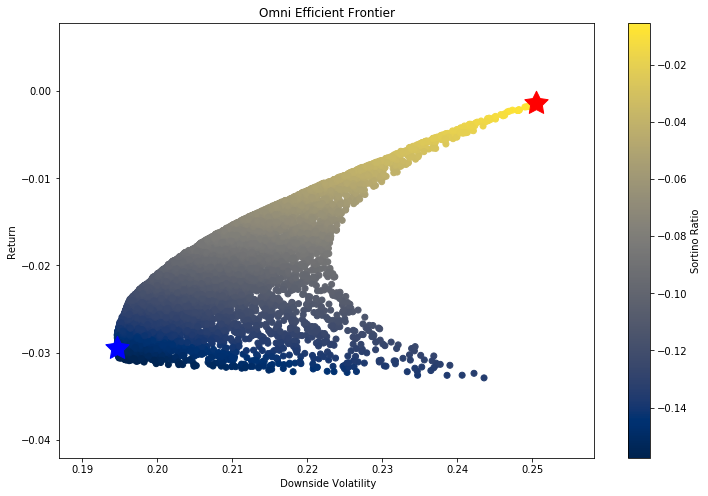

In [27]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Downside SD'],y=result['Mean'],c=result['Sortino'],cmap='cividis')
plt.colorbar(label='Sortino Ratio')
plt.xlabel(' Downside Volatility')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Sortino[1],Max_Sortino[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_DSD[1],Min_DSD[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [28]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [31]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['HDFCBANK.NS', 'KOTAKBANK.NS', 'ICICIBANK.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


HDFCBANK.NS
[*********************100%***********************]  1 of 1 completed
KOTAKBANK.NS
[*********************100%***********************]  1 of 1 completed
ICICIBANK.NS
[*********************100%***********************]  1 of 1 completed


In [32]:
df_raw.head()

,HDFCBANK.NS,KOTAKBANK.NS,ICICIBANK.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,-0.00175,-0.00681,0.02064
2017-05-31,0.00439,0.00426,0.01571
2017-06-01,-0.00464,-0.00352,-0.01945
2017-06-02,0.00347,0.00270,-0.00609


In [33]:
bad_tickers

[]

In [34]:
tickers

['HDFCBANK.NS', 'KOTAKBANK.NS', 'ICICIBANK.NS']

In [35]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [36]:
result.shape
result.ndim

(10000, 6)

2

In [37]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    # Annualizing mean
    E = E*252
    

    
    # Calculating Downside SD
    DSD = df['portfolio_ret'][df['portfolio_ret']<0].std()
    #Annualizing DSD
    DSD = DSD*np.sqrt(252)
                       
   
    #Calculating Annualized Sortino
    Sortino = E/DSD
    
                   
    # Populating the 'result' array with the required values: Mean, SD, Sharpe followed by the weights                   
    result[i,0] = E
    result[i,1] = DSD
    result[i,2] = Sortino
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [38]:
# Converting 'result' into a DataFrame

columns = ['Mean','Downside SD', 'Sortino'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Downside SD,Sortino,HDFCBANK.NS,KOTAKBANK.NS,ICICIBANK.NS
0,0.147001,0.228730,0.642682,0.262596,0.480866,0.256538
1,0.134582,0.220265,0.611000,0.692257,0.033049,0.274694
2,0.143837,0.227107,0.633346,0.356043,0.297835,0.346122
3,0.150118,0.227601,0.659566,0.185115,0.724053,0.090832
4,0.145414,0.231364,0.628510,0.283160,0.275689,0.441151
5,0.145632,0.229441,0.634725,0.288590,0.339389,0.372021
6,0.150746,0.237340,0.635150,0.097396,0.462317,0.440287
7,0.144560,0.222053,0.651017,0.380602,0.537526,0.081872
8,0.143917,0.233067,0.617493,0.319048,0.153147,0.527805
9,0.145985,0.229146,0.637081,0.296910,0.440548,0.262543


In [39]:
Max_Sortino = result.iloc[result['Sortino'].idxmax()]
Max_Sortino

Min_DSD = result.iloc[result['Downside SD'].idxmin()]
Min_DSD

Mean            0.155283
Downside SD     0.234805
Sortino         0.661325
HDFCBANK.NS     0.000403
KOTAKBANK.NS    0.884319
ICICIBANK.NS    0.115277
Name: 5622, dtype: float64

Mean            0.127565
Downside SD     0.208924
Sortino         0.610579
HDFCBANK.NS     0.986063
KOTAKBANK.NS    0.000067
ICICIBANK.NS    0.013870
Name: 9301, dtype: float64

In [40]:
result.iloc[5622]

Mean            0.155283
Downside SD     0.234805
Sortino         0.661325
HDFCBANK.NS     0.000403
KOTAKBANK.NS    0.884319
ICICIBANK.NS    0.115277
Name: 5622, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Downside Volatility')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

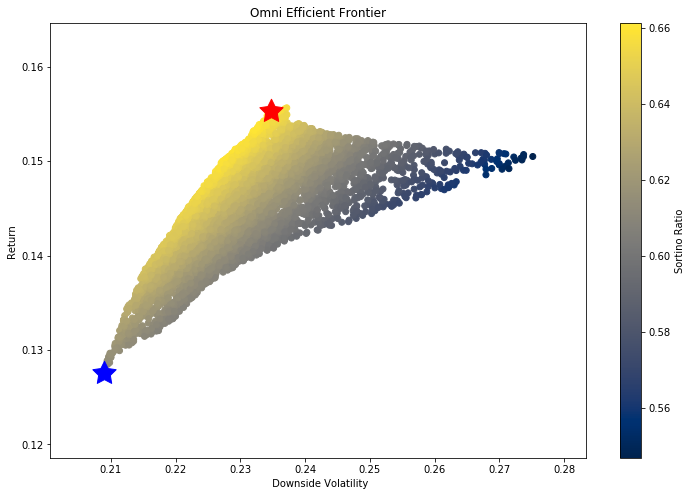

In [41]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Downside SD'],y=result['Mean'],c=result['Sortino'],cmap='cividis')
plt.colorbar(label='Sortino Ratio')
plt.xlabel(' Downside Volatility')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Sortino[1],Max_Sortino[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_DSD[1],Min_DSD[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [1]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)


In [2]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['BAJAJFINSV.NS', 'BAJFINANCE.NS', 'MUTHOOTFIN.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


BAJAJFINSV.NS
[*********************100%***********************]  1 of 1 completed
BAJFINANCE.NS
[*********************100%***********************]  1 of 1 completed
MUTHOOTFIN.NS
[*********************100%***********************]  1 of 1 completed


In [3]:
df_raw.head()

,BAJAJFINSV.NS,BAJFINANCE.NS,MUTHOOTFIN.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,0.03913,0.01078,0.01036
2017-05-31,0.00903,0.00409,0.04455
2017-06-01,0.00324,0.00030,-0.00654
2017-06-02,0.02383,0.02554,0.04452


In [4]:
bad_tickers

[]

In [5]:
tickers

['BAJAJFINSV.NS', 'BAJFINANCE.NS', 'MUTHOOTFIN.NS']

In [6]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [7]:
result.shape
result.ndim

(10000, 6)

2

In [8]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    # Annualizing mean
    E = E*252
    

    
    # Calculating Downside SD
    DSD = df['portfolio_ret'][df['portfolio_ret']<0].std()
    #Annualizing DSD
    DSD = DSD*np.sqrt(252)
                       
   
    #Calculating Annualized Sortino
    Sortino = E/DSD
    
                   
    # Populating the 'result' array with the required values: Mean, SD, Sharpe followed by the weights                   
    result[i,0] = E
    result[i,1] = DSD
    result[i,2] = Sortino
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [9]:
# Converting 'result' into a DataFrame

columns = ['Mean','Downside SD', 'Sortino'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Downside SD,Sortino,BAJAJFINSV.NS,BAJFINANCE.NS,MUTHOOTFIN.NS
0,0.300564,0.327640,0.917362,0.457072,0.474087,0.068841
1,0.303543,0.289338,1.049095,0.586984,0.089566,0.323450
2,0.368579,0.298917,1.233049,0.202440,0.416468,0.381092
3,0.370962,0.313487,1.183342,0.134853,0.573316,0.291832
4,0.296122,0.338428,0.874994,0.450111,0.541736,0.008153
5,0.352490,0.316852,1.112475,0.218419,0.549935,0.231647
6,0.372214,0.284821,1.306836,0.245082,0.261060,0.493858
7,0.290637,0.298964,0.972147,0.617187,0.149547,0.233267
8,0.357008,0.287144,1.243308,0.305336,0.264933,0.429732
9,0.369971,0.297481,1.243680,0.197620,0.414225,0.388155


In [11]:
Max_Sortino = result.iloc[result['Sortino'].idxmax()]
Max_Sortino

Min_DSD = result.iloc[result['Downside SD'].idxmin()]
Min_DSD

Mean             0.452966
Downside SD      0.275632
Sortino          1.643375
BAJAJFINSV.NS    0.009789
BAJFINANCE.NS    0.011138
MUTHOOTFIN.NS    0.979073
Name: 490, dtype: float64

Mean             0.383273
Downside SD      0.268149
Sortino          1.429326
BAJAJFINSV.NS    0.294879
BAJFINANCE.NS    0.004721
MUTHOOTFIN.NS    0.700400
Name: 5796, dtype: float64

In [12]:
result.iloc[490]

Mean             0.452966
Downside SD      0.275632
Sortino          1.643375
BAJAJFINSV.NS    0.009789
BAJFINANCE.NS    0.011138
MUTHOOTFIN.NS    0.979073
Name: 490, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Downside Volatility')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

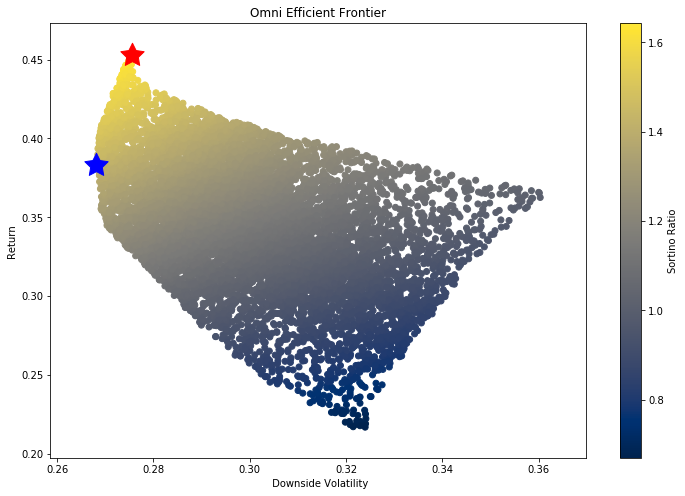

In [13]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Downside SD'],y=result['Mean'],c=result['Sortino'],cmap='cividis')
plt.colorbar(label='Sortino Ratio')
plt.xlabel(' Downside Volatility')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Sortino[1],Max_Sortino[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_DSD[1],Min_DSD[0],marker=(5,1,0),color='b',s=600)
plt.show()

In [59]:
# standard imports
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import datetime as dt
import yfinance as yf
import matplotlib.pyplot as plt
import pyfolio as pf


from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_rows', None)

In [60]:
# standard finance DataFrame multiple assets
# Can directly fetch the returns from Yahoo using the following

start = dt.datetime(2017,5,29).date()
end = dt.datetime(2020,6,29).date()

tickers=['PFIZER.NS', 'ASTRAZEN.NS', 'GLAXO.NS']

DF =pd.DataFrame()
bad_tickers =[]

for i in tickers:
    try:
        print(i)
         # USE dropna() on the raw price data before calculating returns using pct_change
         # Use Adjusted prices only
        df = yf.download(i,start,end)[['Adj Close']].dropna().pct_change()
        df.columns = [i]                         
        DF = pd.concat([DF,df],axis =1)
    except:
        bad_tickers.append(i)
        

df_raw = DF.copy().round(5)


PFIZER.NS
[*********************100%***********************]  1 of 1 completed
ASTRAZEN.NS
[*********************100%***********************]  1 of 1 completed
GLAXO.NS
[*********************100%***********************]  1 of 1 completed


In [61]:
df_raw.head()

,PFIZER.NS,ASTRAZEN.NS,GLAXO.NS
Date,,,
2017-05-29,NaN,NaN,NaN
2017-05-30,-0.00302,-0.00200,0.02555
2017-05-31,0.01114,0.00584,0.01678
2017-06-01,0.03079,0.00710,0.01365
2017-06-02,-0.01712,-0.00118,0.00164


In [62]:
bad_tickers

[]

In [63]:
tickers

['PFIZER.NS', 'ASTRAZEN.NS', 'GLAXO.NS']

In [64]:
num_runs = 10000 # number of rows/iterations
result = np.zeros((num_runs,(len(tickers)+3)))
result

array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]])

In [65]:
result.shape
result.ndim

(10000, 6)

2

In [66]:
df = df_raw.copy()

for i in range(num_runs):
    
    # randomized weights
    weights = np.array(np.random.random(len(tickers))) 
    #Rebalance w/ constraints (SUM of all weights CANNOT BE > 1)
    weights = weights/np.sum(weights)
    
    ### daily return of the portfolio based on a given set of weights
    df['portfolio_ret'] = df.iloc[:,0]*weights[0]+df.iloc[:,1]*weights[1]+df.iloc[:,2]*weights[2]
  
                       
    # Calculating mean
    E = df['portfolio_ret'].mean()
    # Annualizing mean
    E = E*252
    

    
    # Calculating Downside SD
    DSD = df['portfolio_ret'][df['portfolio_ret']<0].std()
    #Annualizing DSD
    DSD = DSD*np.sqrt(252)
                       
   
    #Calculating Annualized Sortino
    Sortino = E/DSD
    
                   
    # Populating the 'result' array with the required values: Mean, SD, Sharpe followed by the weights                   
    result[i,0] = E
    result[i,1] = DSD
    result[i,2] = Sortino
    
    for j in range(len(tickers)):
        result[i,j+3]= weights[j]

In [67]:
# Converting 'result' into a DataFrame

columns = ['Mean','Downside SD', 'Sortino'] + tickers

result = pd.DataFrame(result,columns=columns)
result

,Mean,Downside SD,Sortino,PFIZER.NS,ASTRAZEN.NS,GLAXO.NS
0,0.343704,0.157368,2.184086,0.423273,0.264867,0.311860
1,0.298921,0.149981,1.993056,0.451813,0.129903,0.418284
2,0.352497,0.190252,1.852784,0.124076,0.473767,0.402158
3,0.254767,0.149164,1.707966,0.437189,0.023400,0.539411
4,0.305520,0.174297,1.752871,0.141204,0.340150,0.518646
5,0.322651,0.151678,2.127201,0.699119,0.038377,0.262503
6,0.185649,0.168501,1.101772,0.173136,0.006509,0.820354
7,0.371747,0.166139,2.237566,0.401657,0.351708,0.246635
8,0.331396,0.181009,1.830824,0.140314,0.408441,0.451245
9,0.340800,0.172279,1.978191,0.235172,0.374127,0.390702


In [68]:
Max_Sortino = result.iloc[result['Sortino'].idxmax()]
Max_Sortino

Min_DSD = result.iloc[result['Downside SD'].idxmin()]
Min_DSD

Mean           0.427177
Downside SD    0.170704
Sortino        2.502447
PFIZER.NS      0.668411
ASTRAZEN.NS    0.331086
GLAXO.NS       0.000503
Name: 2553, dtype: float64

Mean           0.274222
Downside SD    0.146838
Sortino        1.867509
PFIZER.NS      0.550374
ASTRAZEN.NS    0.004010
GLAXO.NS       0.445616
Name: 9353, dtype: float64

In [69]:
result.iloc[2553]

Mean           0.427177
Downside SD    0.170704
Sortino        2.502447
PFIZER.NS      0.668411
ASTRAZEN.NS    0.331086
GLAXO.NS       0.000503
Name: 2553, dtype: float64

<Figure size 864x576 with 0 Axes>

Text(0.5, 0, ' Downside Volatility')

Text(0, 0.5, 'Return')

Text(0.5, 1.0, 'Omni Efficient Frontier')

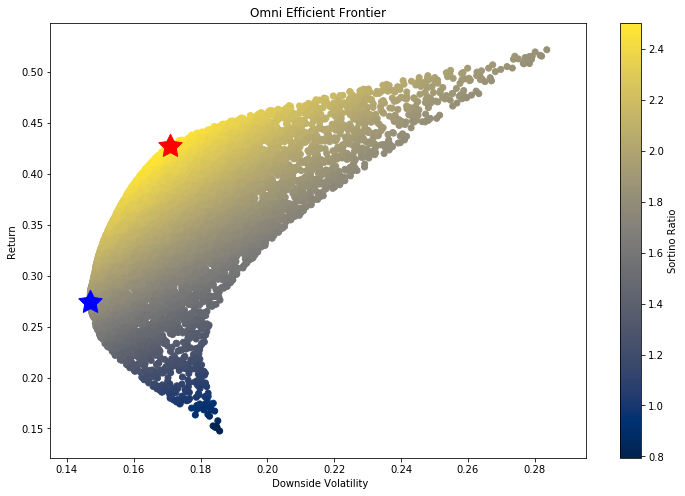

In [70]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(12,8))
plt.scatter(x=result['Downside SD'],y=result['Mean'],c=result['Sortino'],cmap='cividis')
plt.colorbar(label='Sortino Ratio')
plt.xlabel(' Downside Volatility')
plt.ylabel('Return')

plt.title('Omni Efficient Frontier')
#Plot a red star to highlight position of the portfolio with highest Sortino Ratio
plt.scatter(Max_Sortino[1],Max_Sortino[0],marker=(5,1,0),color='r',s=600)

#Plot a blue star to highlight position of the portfolio with minimum Variance
plt.scatter(Min_DSD[1],Min_DSD[0],marker=(5,1,0),color='b',s=600)
plt.show()